**Pair Plot**

From this visualization, which features are you going to use for your logistic regression?

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import math

from describe import loadData, trainDataFilePath, house_color_map


data = loadData(trainDataFilePath())
if data is None:
    exit(1)

df = data.drop(columns=['Index', 'index'], errors='ignore')

all_houses = df["Hogwarts House"].dropna().unique()

feature_cols = df.select_dtypes(include='number').columns
num_features = len(feature_cols)

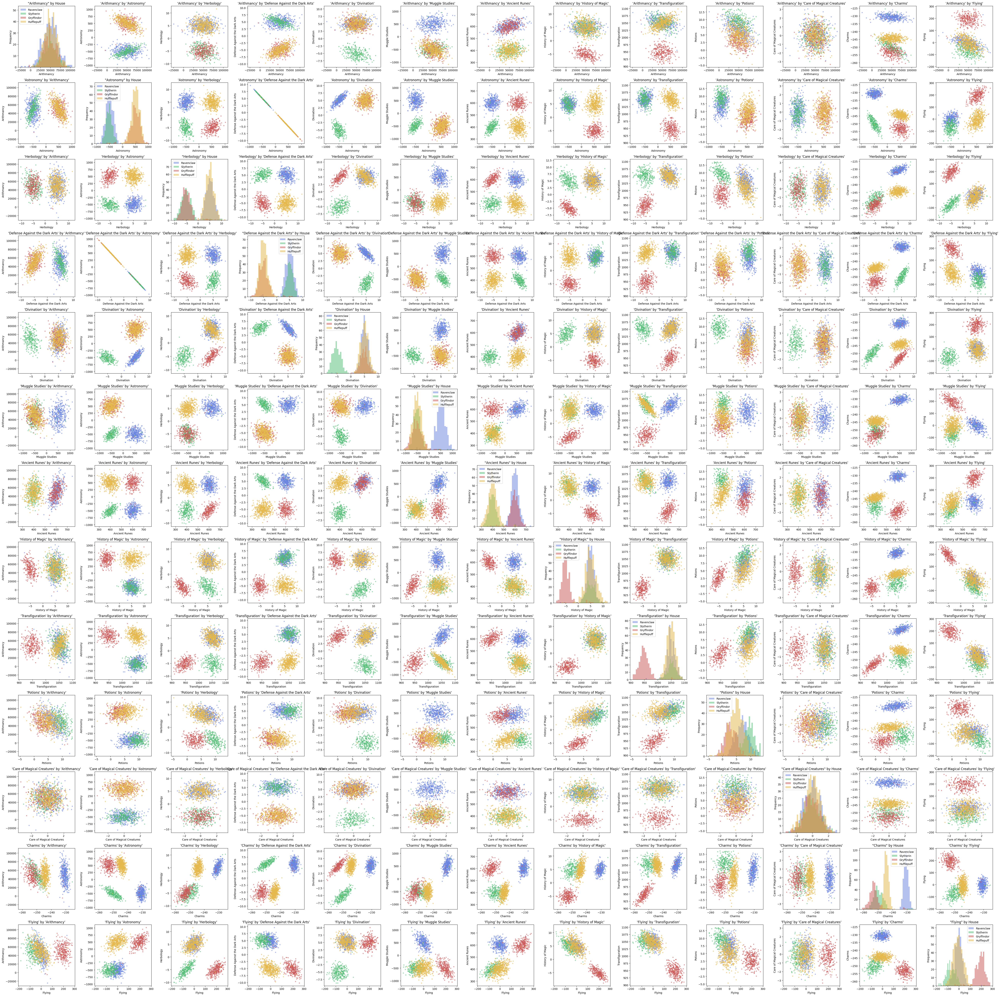

In [2]:
fig, axes = plt.subplots(num_features, num_features, figsize=(num_features*4, num_features*4), squeeze=False)

for y_i, y_feature in enumerate(feature_cols):
    for x_i, x_feature in enumerate(feature_cols):
        ax = axes[x_i, y_i]

        if x_i == y_i:
            for house in all_houses:
                house_data = df[df["Hogwarts House"] == house][x_feature].dropna()
                ax.hist(house_data, bins=30, alpha=0.5, label=house, color=house_color_map[house])

            ax.set_title(f'"{x_feature}" by House')
            ax.set_xlabel(x_feature)
            ax.set_ylabel('Frequency')
            ax.legend()

        else:
            for house in all_houses:
                house_bool_maks = df["Hogwarts House"] == house
                x = df[house_bool_maks][x_feature]
                y = df[house_bool_maks][y_feature]
                ax.scatter(x, y, s=10, alpha=0.5, label=house, c=house_color_map[house])
            ax.set_title(f"'{x_feature}' by '{y_feature}'")
            ax.set_xlabel(x_feature)
            ax.set_ylabel(y_feature)

plt.tight_layout()
plt.show()

In [3]:
feature_cols

Index(['Arithmancy', 'Astronomy', 'Herbology', 'Defense Against the Dark Arts',
       'Divination', 'Muggle Studies', 'Ancient Runes', 'History of Magic',
       'Transfiguration', 'Potions', 'Care of Magical Creatures', 'Charms',
       'Flying'],
      dtype='object')

| Subject                       | Keep | Explanation |
|-------------------------------|------|-------------|
| Arithmancy                    | NO   | Histogram shows the house data distribution is too homogeneus |
| Astronomy                     | YES  | Shows a good split between Rav & Sly and Grf & Huf |
| Herbology                     | YES  | Show a good split between Sly & Grf and Rav & Huf |
| Defense Against the Dark Arts | NO   | Data is the same as Astronomy, one axis flipped |
| Divination                    | YES  | Shows a split between Sly and the other houses |
| Muggle Studies                | YES  | Shows a split between Rav and the other houses |
| Ancient Runes                 | YES  | Show a good split between Huf & Sly and Rav & Grf |
| History of Magic              | NO   | Data looks like an inversion for Flying and Tranfiguration |
| Transfiguration               | NO   | Data is very simmilar to Flying |
| Potions                       | YES  | But it's close, data is fairly homogeneus |
| Care of Magical Creatures     | NO   | It's too homogeneus |
| Charms                        | YES  | Shows a good distictuion for Rav and slightly for Huf |
| Flying                        | YES  | Shows a split between Grf and the other houses, has no missing data, as compared to HoM and Trans |
